# Azure OpenAI benchmarks

<img src="logo.jpg">


- This notebook will do some benchmarks tests on your Azure OpenAI models on PayGo and/or PTU.
- This notebook is using the GitGub repo from Microsoft: https://github.com/Azure/azure-openai-benchmark

### Predefined scenarios
<img src="image1.jpg">

### Profiles
<img src="image2.jpg">

### Generated metrics
<img src="image3.jpg">

In [1]:
#%pip install -U kaleido

In [2]:
import datetime
import json
import matplotlib.pyplot as plt
import openai
import os
import pandas as pd
import plotly.express as px
import seaborn as sns
import shutil
import subprocess
import sweetviz as sv
import sys
import time

from IPython.display import FileLink
from openai import AzureOpenAI
from plotly.subplots import make_subplots
%matplotlib inline

In [3]:
print(f"Today is {str(datetime.datetime.today())}")

Today is 2024-06-20 09:25:37.455272


In [4]:
print(f"Python version: {sys.version}")
print(f"OpenAI version: {openai.__version__}")

Python version: 3.10.11 (main, May 16 2023, 00:28:57) [GCC 11.2.0]
OpenAI version: 1.30.5


### To maximize cells output

In [5]:
%%javascript Python 
OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

## 1. Settings

In [6]:
HOME = os.getcwd()
print(f"Current directory is: {HOME}")

Current directory is: /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks


In [7]:
# Dir to save all the generated results
RES_DIR = "results"
os.makedirs(RES_DIR, exist_ok=True)

RESULTS_DIR = f"{RES_DIR}/results_{datetime.datetime.today().strftime('%d%b%Y_%H%M%S')}"
os.makedirs(RESULTS_DIR, exist_ok=True)

In [8]:
# Dir to download the github repo from https://github.com/Azure/azure-openai-benchmark
DIR_BENCHMARK = 'azure-openai-benchmark'

# Delete the dir
shutil.rmtree(DIR_BENCHMARK)

In [9]:
!git clone https://github.com/Azure/azure-openai-benchmark

Cloning into 'azure-openai-benchmark'...
remote: Enumerating objects: 224, done.
remote: Counting objects: 100% (158/158), done.
remote: Compressing objects: 100% (51/51), done.
remote: Total 224 (delta 129), reused 107 (delta 107), pack-reused 66
Receiving objects: 100% (224/224), 59.81 KiB | 174.00 KiB/s, done.
Resolving deltas: 100% (137/137), done.


In [10]:
os.chdir(DIR_BENCHMARK)

In [11]:
#!pip install -r requirements.txt

In [12]:
print(f"Current directory is: {os.getcwd()}")

Current directory is: /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/azure-openai-benchmark


## 2. Models to benchmark

### 2.1 Your Azure OpenAI endpoint and key

In [13]:
ENDPOINT = "TO BE COMPLETED"
KEY = "TO BE COMPLETED"

In [14]:
VERSION = "2024-05-01-preview"

In [15]:
os.environ['OPENAI_API_KEY'] = KEY

### 2.2 Models to compare. You can choose PayGO models or PTU deployed models

In [16]:
MODEL1 = "gpt-4o"
MODEL2 = "gpt-4-turbo-2024-04-09"

print(f"This notebook will do some Azure OpenAI benchmarks on models: {MODEL1} and {MODEL2}")

This notebook will do some Azure OpenAI benchmarks on models: gpt-4o and gpt-4-turbo-2024-04-09


## 3. Syntax and available options from the Microsoft benchmark tool

In [17]:
!python -m benchmark.bench load --help

usage: bench.py load [-h] [-a API_VERSION] [-k API_KEY_ENV] [-c CLIENTS]
                     [-n REQUESTS] [-d DURATION] [-r RATE]
                     [-w AGGREGATION_WINDOW]
                     [-s {balanced,context,generation,custom}]
                     [-p CONTEXT_TOKENS] [-m MAX_TOKENS] [-i COMPLETIONS]
                     [--frequency-penalty FREQUENCY_PENALTY]
                     [--presence-penalty PRESENCE_PENALTY]
                     [--temperature TEMPERATURE] [--top-p TOP_P]
                     [-f {jsonl,human}] [-t {none,exponential}] -e DEPLOYMENT
                     api_base_endpoint

positional arguments:
  api_base_endpoint     Azure OpenAI deployment base endpoint.

optional arguments:
  -h, --help            show this help message and exit
  -a API_VERSION, --api-version API_VERSION
                        Set OpenAI API version.
  -k API_KEY_ENV, --api-key-env API_KEY_ENV
                        Environment variable that contains the API KEY.
  -c CLIENTS,

> Documentation: https://github.com/Azure/azure-openai-benchmark

## 4. Quick test using GPT-4o

In [18]:
print(f"Let's use the {MODEL1} model")

Let's use the gpt-4o model


In [20]:
command = [
    'python', '-m', 'benchmark.bench', 'load',
    '--deployment', MODEL1,  # Model to use
    '--rate', '10',  # RPM
    '--retry', 'exponential',  # Retry
    '--duration', '30',  # Duration in seconds
    ENDPOINT  # Model endpoint to use
]

# Run the command
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL1}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start
print("Done")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-20 09:29:05.222562 Running benchmarks for model gpt-4o...
Done
Elapsed time: 00:00:37.207122


In [21]:
print("\033[1;31;34m")
print(result.stdout)


2024-06-20 09:29:07 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-20 09:29:08 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-20 09:29:09 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-20 09:29:10 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n

In [22]:
print("\033[1;31;34m")
print(result.stderr)


2024-06-20 09:29:06 INFO     using shape profile balanced: context tokens: 500, max tokens: 500
2024-06-20 09:29:06 INFO     warming up prompt cache
2024-06-20 09:29:06 INFO     starting load...
2024-06-20 09:29:36 INFO     waiting for 6 requests to drain
2024-06-20 09:29:42 INFO     finished load test



## 5. Advanced testing with model 1 (GPT-4o)

In [23]:
print(f"Benchmarks for model {MODEL1}")

Benchmarks for model gpt-4o


In [24]:
# With output file generation
OUTPUT_FILE = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}.txt")

command = [
    'python', '-m', 'benchmark.bench', 'load',
    '--deployment', MODEL1,  # Model to use
    '--rate', '30',  # RPM
    '--duration', '240',  # Duration in seconds (should be > 30)
    '--shape', 'custom',  # Custom request shape
    '--context-tokens', '1000',  # Context tokens
    '--max-tokens', '500',  # Max tokens
    '--output-format', 'human',  # Output format
    ENDPOINT  # Model endpoint to use
]

# Running the benchmarks
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL1}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start

# Saving the results into a file
with open(OUTPUT_FILE, 'w') as f:
    f.write(result.stdout)

print(f"Benchmark output saved to file {OUTPUT_FILE}")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-20 09:30:44.106446 Running benchmarks for model gpt-4o...
Benchmark output saved to file /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_gpt-4o.txt
Elapsed time: 00:04:07.877253


In [25]:
# Define the columns to read and their corresponding indices in the file
columns = {
    'timestamp': (0, 2),
    'rpm': 3,
    'processing': 5,
    'completed': 7,
    'failures': 9,
    'throttled': 11,
    'requests': 13,
    'tpm': 15,
    'ttft_avg': 17,
    'ttft_95th': 19,
    'tbt_avg': 21,
    'tbt_95th': 23,
    'e2e_avg': 25,
    'e2e_95th': 27,
    'util_avg': 29,
    'util_95th': 31
}

data = {key: [] for key in columns.keys()}

# Reading file
with open(OUTPUT_FILE, 'r') as file:
    for line in file:
        fields = line.strip().split()
        for key, idx in columns.items():
            if isinstance(idx, tuple):
                value = ' '.join(fields[idx[0]:idx[1]])
            else:
                value = fields[idx]
            data[key].append(value)

df1 = pd.DataFrame(data)
df1 = df1.replace('n/a', 0)
int_columns = ['processing', 'completed', 'failures', 'throttled', 'requests']
float_columns = [
    'rpm', 'tpm', 'ttft_avg', 'ttft_95th', 'tbt_avg', 'tbt_95th', 'e2e_avg',
    'e2e_95th', 'util_avg', 'util_95th'
]
df1[int_columns] = df1[int_columns].astype(int)
df1[float_columns] = df1[float_columns].astype(float)
df1['model'] = MODEL1

In [26]:
df1.shape

(246, 17)

In [27]:
df1

,timestamp,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th,model
0,2024-06-20 09:30:47,0.0,2,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
1,2024-06-20 09:30:48,0.0,2,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
2,2024-06-20 09:30:49,0.0,3,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
3,2024-06-20 09:30:50,0.0,3,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
4,2024-06-20 09:30:51,0.0,4,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241,2024-06-20 09:34:48,26.0,2,115,0,0,115,39078.0,0.175,0.32,0.012,0.013,6.262,6.933,0.0,0.0,gpt-4o
242,2024-06-20 09:34:49,25.0,2,115,0,0,115,37575.0,0.177,0.32,0.012,0.013,6.262,6.933,0.0,0.0,gpt-4o
243,2024-06-20 09:34:50,26.0,1,116,0,0,116,39078.0,0.176,0.32,0.012,0.013,6.259,6.932,0.0,0.0,gpt-4o
244,2024-06-20 09:34:51,25.0,1,116,0,0,116,37575.0,0.177,0.32,0.012,0.013,6.259,6.932,0.0,0.0,gpt-4o


In [28]:
df1.describe()

,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,246.000000,246.000000,246.000000,246.0,246.0,246.000000,246.000000,246.000000,246.000000,246.000000,246.000000,246.000000,246.000000,246.0,246.0
mean,25.379675,2.963415,57.752033,0.0,0.0,57.752033,38146.845528,0.172602,0.261907,0.011699,0.012878,6.112931,6.710252,0.0,0.0
std,4.373864,0.634616,34.386748,0.0,0.0,34.386748,6574.152013,0.037289,0.064219,0.001862,0.002171,0.970242,1.071264,0.0,0.0
min,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,26.000000,3.000000,27.000000,0.0,0.0,27.000000,39078.000000,0.158000,0.228000,0.012000,0.013000,6.224000,6.844000,0.0,0.0
50%,26.000000,3.000000,57.500000,0.0,0.0,57.500000,39078.000000,0.171000,0.294000,0.012000,0.013000,6.268000,6.884000,0.0,0.0
75%,27.000000,3.000000,87.000000,0.0,0.0,87.000000,40581.000000,0.188000,0.306000,0.012000,0.014000,6.300000,6.929000,0.0,0.0
max,28.000000,5.000000,117.000000,0.0,0.0,117.000000,42084.000000,0.295000,0.331000,0.013000,0.014000,6.451000,7.234000,0.0,0.0


In [29]:
cols_to_plot = int_columns + float_columns
cols_to_plot

['processing',
 'completed',
 'failures',
 'throttled',
 'requests',
 'rpm',
 'tpm',
 'ttft_avg',
 'ttft_95th',
 'tbt_avg',
 'tbt_95th',
 'e2e_avg',
 'e2e_95th',
 'util_avg',
 'util_95th']

### 5.1 Lineplots using Plotly

In [30]:
for col in cols_to_plot:
    fig = px.line(df1,
                  x=df1.index,
                  y=df1[col],
                  title=f'{col} for model {MODEL1}')
    fig.show()
    fig.write_image(os.path.join(HOME, RESULTS_DIR, f"{MODEL1}_lineplot_{col}.jpg"))

### 5.2 Lineplots using Seaborn

In [31]:
df1 = df1.reset_index()

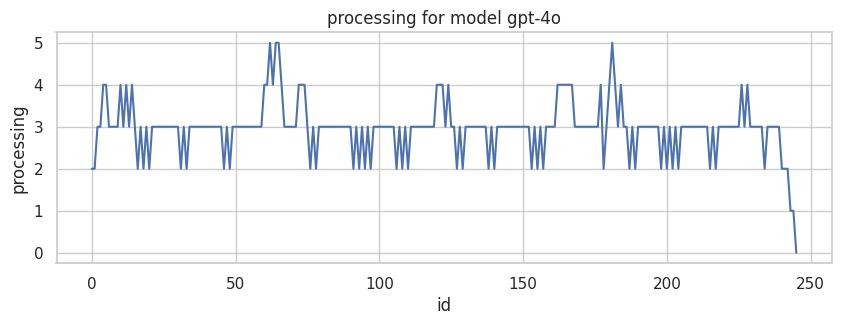

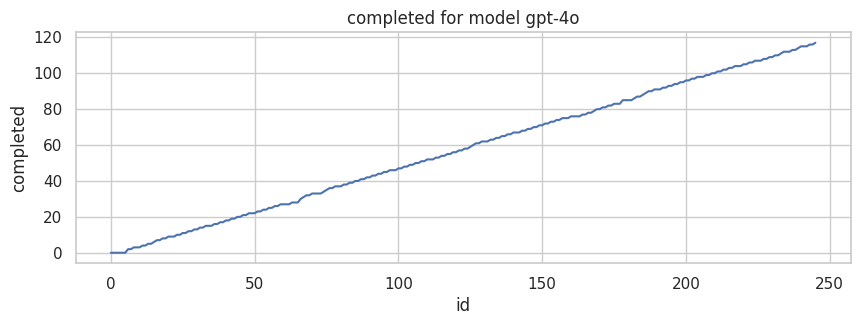

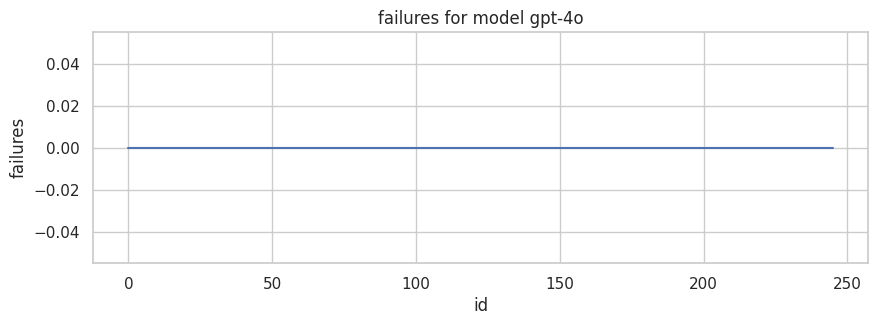

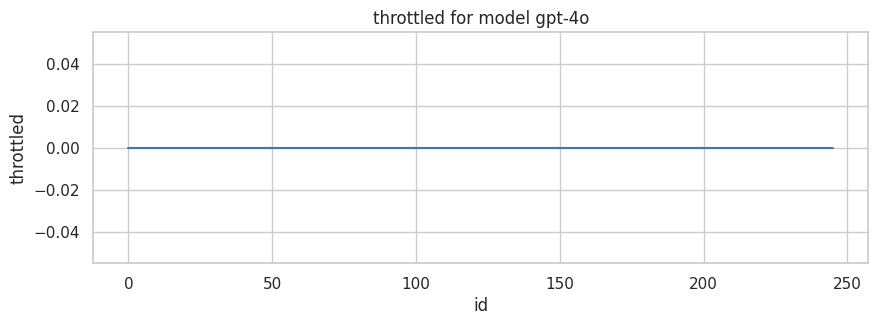

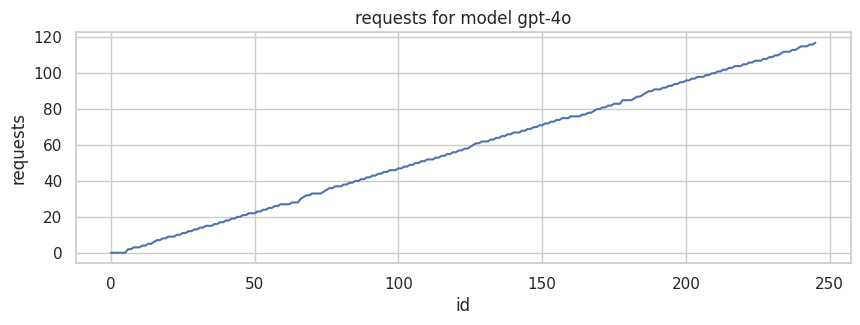

...

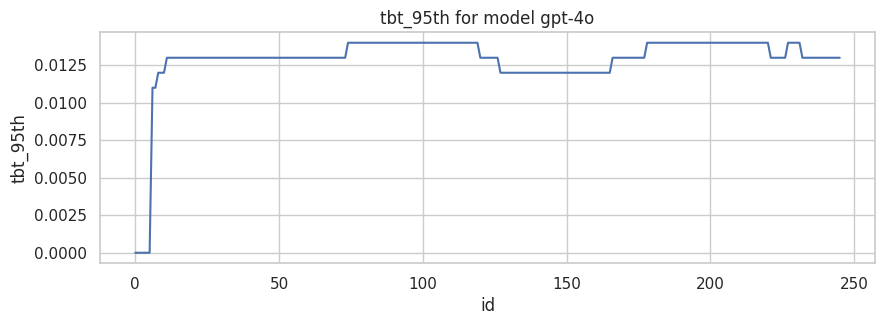

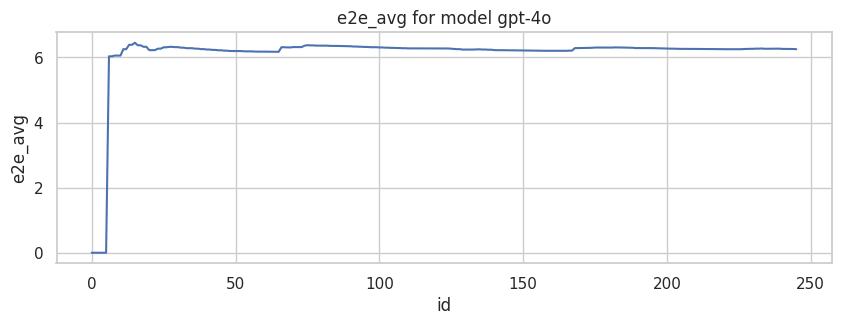

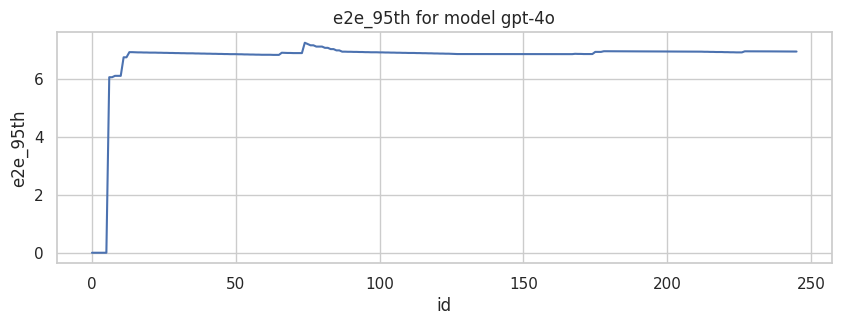

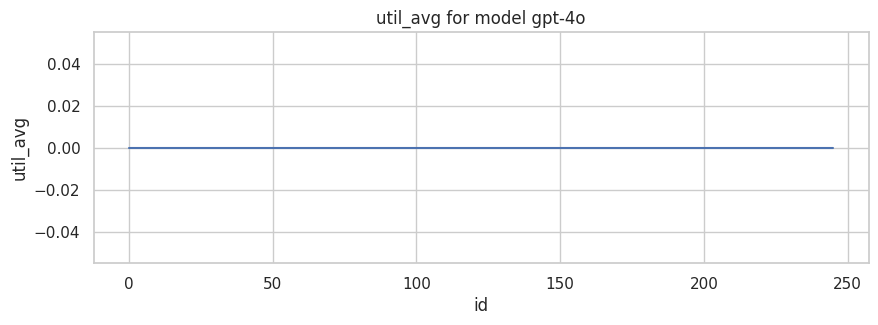

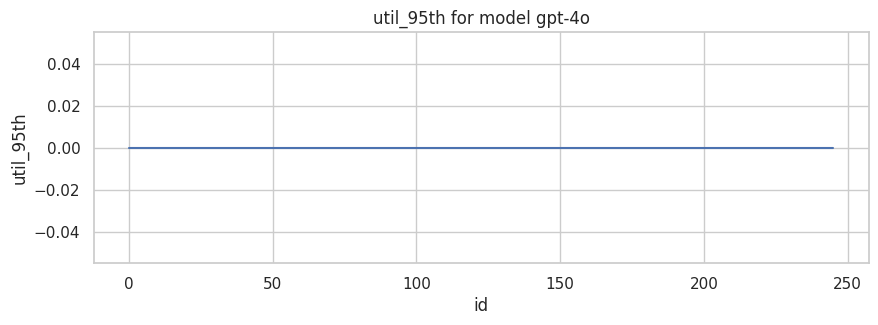

In [32]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.lineplot(data=df1, x='index', y=col)
    plt.title(f'{col} for model {MODEL1}')
    plt.xlabel('id')
    plt.ylabel(col)
    plt.show()

### 5.3 Boxplots using Plotly

In [33]:
for col in cols_to_plot:
    fig = px.box(df1, y=df1[col], title=f'{col} for model {MODEL1}')
    fig.show()
    fig.write_image(os.path.join(HOME, RESULTS_DIR, f"{MODEL1}_boxplot_{col}.jpg"))

### 5.4 Boxplots using Seaborn

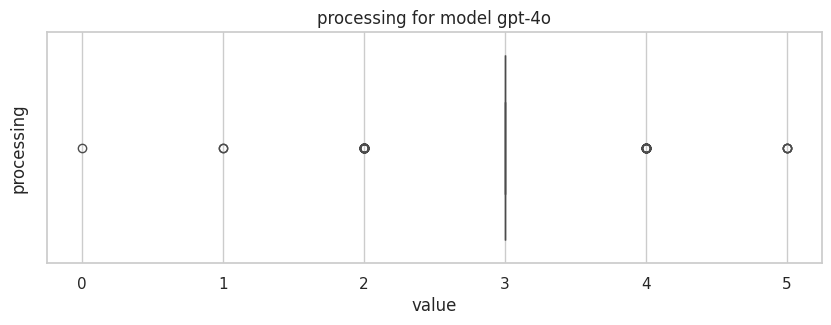

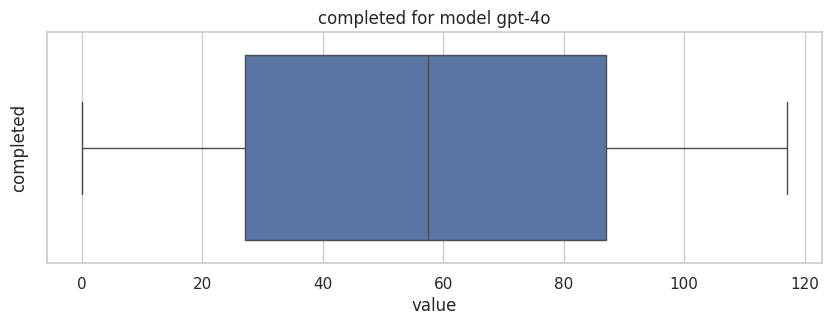

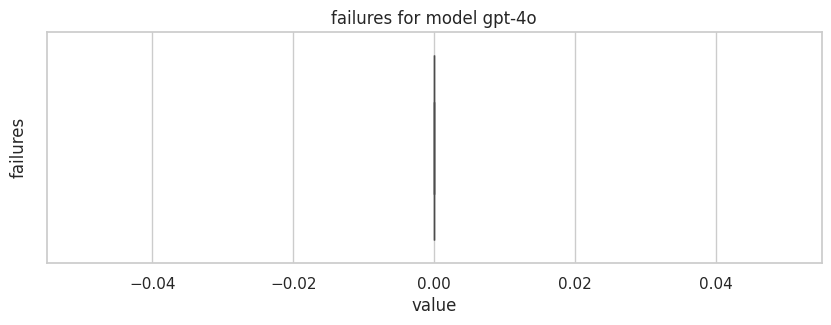

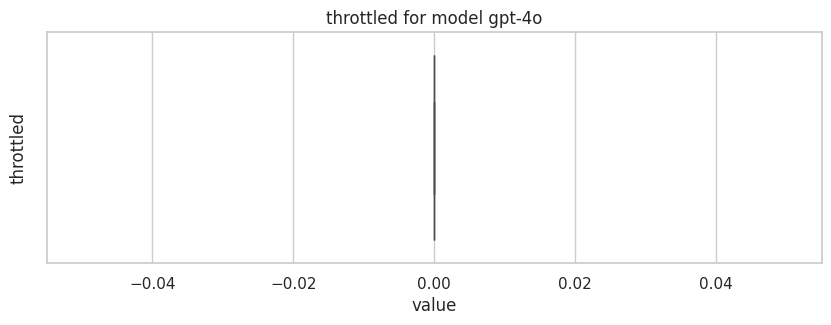

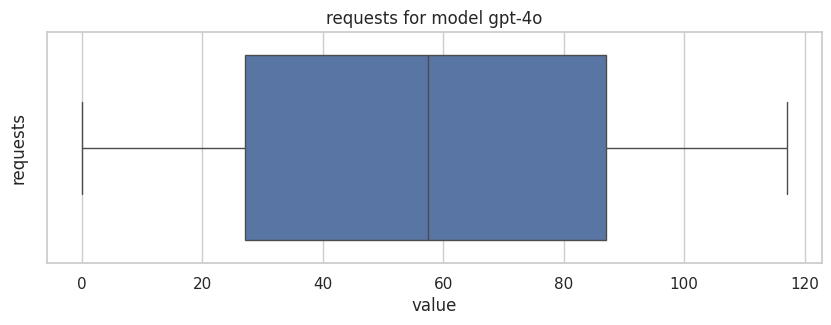

...

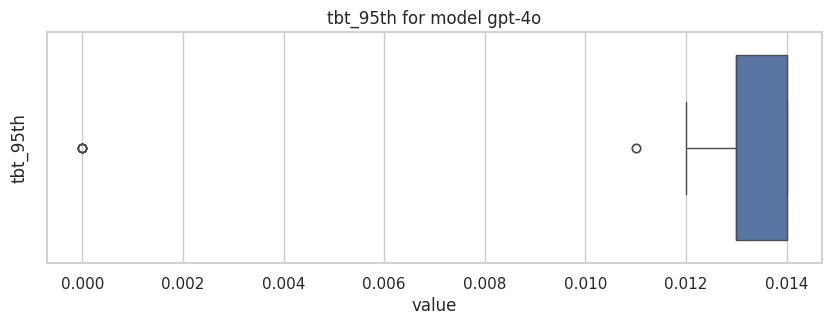

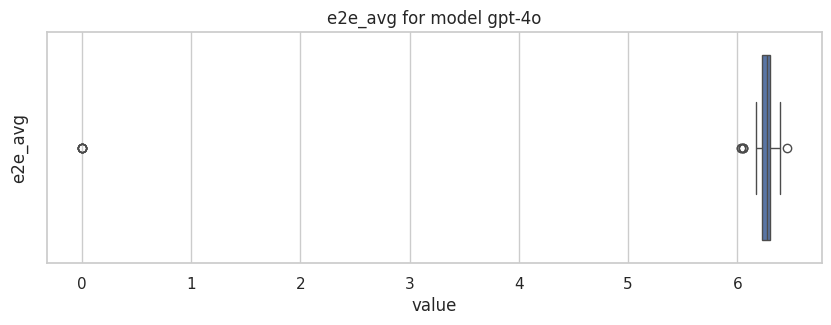

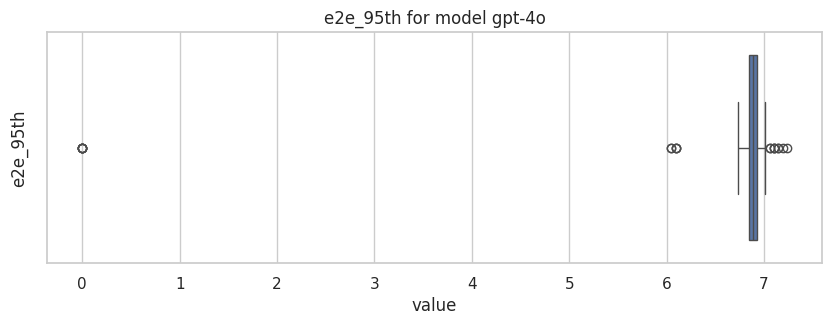

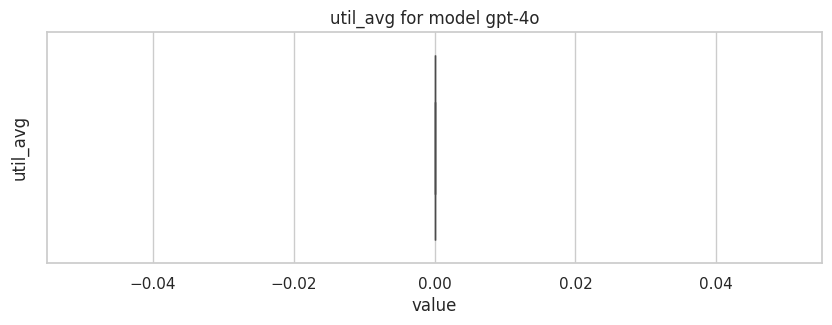

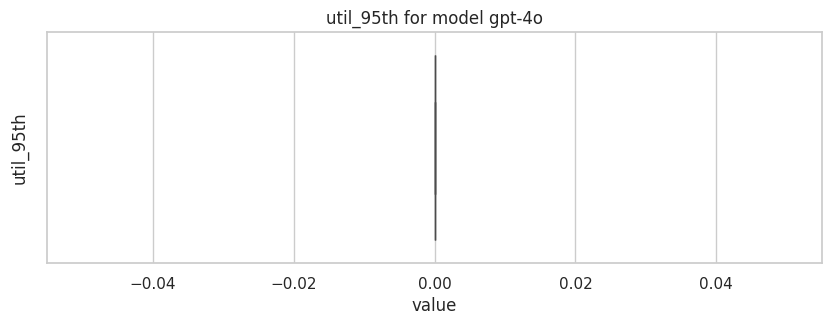

In [34]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.boxplot(x=df1[col])
    plt.title(f'{col} for model {MODEL1}')
    plt.xlabel('value')
    plt.ylabel(col)
    plt.show()

## 6. Comparing benchmarks

### 6.1 Running benchmarks from the second model

In [35]:
print(f"Benchmarks for model {MODEL2}")

Benchmarks for model gpt-4-turbo-2024-04-09


In [36]:
# With output file generation
OUTPUT_FILE = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL2}.txt")

command = [
    'python', '-m', 'benchmark.bench', 'load',
    '--deployment', MODEL2,  # Model to use
    '--rate', '30',  # RPM
    '--duration', '240',  # Duration in seconds (should be > 30)
    '--shape', 'custom',  # Custom request shape
    '--context-tokens', '1000',  # Context tokens
    '--max-tokens', '500',  # Max tokens
    '--output-format', 'human',  # Output format
    ENDPOINT  # Model endpoint to use
]

# Running the benchmarks
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL2}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start

# Saving the results into a file
with open(OUTPUT_FILE, 'w') as f:
    f.write(result.stdout)

print(f"Benchmark output saved to file {OUTPUT_FILE}")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-20 09:35:05.138537 Running benchmarks for model gpt-4-turbo-2024-04-09...
Benchmark output saved to file /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_gpt-4-turbo-2024-04-09.txt
Elapsed time: 00:04:50.367708


In [37]:
# Define the columns to read and their corresponding indices in the file
columns = {
    'timestamp': (0, 2),
    'rpm': 3,
    'processing': 5,
    'completed': 7,
    'failures': 9,
    'throttled': 11,
    'requests': 13,
    'tpm': 15,
    'ttft_avg': 17,
    'ttft_95th': 19,
    'tbt_avg': 21,
    'tbt_95th': 23,
    'e2e_avg': 25,
    'e2e_95th': 27,
    'util_avg': 29,
    'util_95th': 31
}

data = {key: [] for key in columns.keys()}

# Reading file
with open(OUTPUT_FILE, 'r') as file:
    for line in file:
        fields = line.strip().split()
        for key, idx in columns.items():
            if isinstance(idx, tuple):
                value = ' '.join(fields[idx[0]:idx[1]])
            else:
                value = fields[idx]
            data[key].append(value)

df2 = pd.DataFrame(data)
df2 = df2.replace('n/a', 0)
int_columns = ['processing', 'completed', 'failures', 'throttled', 'requests']
float_columns = [
    'rpm', 'tpm', 'ttft_avg', 'ttft_95th', 'tbt_avg', 'tbt_95th', 'e2e_avg',
    'e2e_95th', 'util_avg', 'util_95th'
]
df2[int_columns] = df2[int_columns].astype(int)
df2[float_columns] = df2[float_columns].astype(float)
df2['model'] = MODEL2

In [38]:
df2.shape

(289, 17)

In [39]:
df2

,timestamp,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th,model
0,2024-06-20 09:35:07,0.0,2,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
1,2024-06-20 09:35:08,0.0,2,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
2,2024-06-20 09:35:09,0.0,3,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
3,2024-06-20 09:35:10,0.0,3,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
4,2024-06-20 09:35:11,0.0,4,0,0,0,0,0.0,0.000,0.00,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,2024-06-20 09:39:52,2.0,1,116,52,52,116,3006.0,7.141,13.14,0.115,0.149,45.124,65.121,0.0,0.0,gpt-4-turbo-2024-04-09
285,2024-06-20 09:39:53,2.0,1,116,52,52,116,3006.0,7.141,13.14,0.115,0.149,45.124,65.121,0.0,0.0,gpt-4-turbo-2024-04-09
286,2024-06-20 09:39:54,2.0,1,116,52,52,116,3006.0,7.141,13.14,0.115,0.149,45.124,65.121,0.0,0.0,gpt-4-turbo-2024-04-09
287,2024-06-20 09:39:55,0.0,1,116,52,52,116,0.0,0.000,0.00,0.000,0.000,45.124,65.121,0.0,0.0,gpt-4-turbo-2024-04-09


In [40]:
df2.describe()

,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.0,289.0
mean,5.254671,10.217993,58.851211,28.318339,28.318339,58.851211,7898.186851,1.058104,1.786491,0.065945,0.076484,38.801990,54.859201,0.0,0.0
std,4.041991,4.395099,39.313404,17.745179,17.745179,39.313404,6074.431789,1.901375,2.799086,0.034957,0.051475,16.577219,25.139970,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,1.000000,7.000000,25.000000,14.000000,14.000000,25.000000,1503.000000,0.525000,0.000000,0.064000,0.000000,44.055000,59.238000,0.0,0.0
50%,6.000000,11.000000,59.000000,28.000000,28.000000,59.000000,9018.000000,0.690000,0.930000,0.079000,0.097000,44.734000,65.000000,0.0,0.0
75%,9.000000,14.000000,91.000000,42.000000,42.000000,91.000000,13527.000000,0.987000,1.854000,0.087000,0.118000,47.451000,68.478000,0.0,0.0
max,13.000000,17.000000,117.000000,52.000000,52.000000,117.000000,19539.000000,18.428000,13.140000,0.139000,0.149000,51.608000,77.674000,0.0,0.0


### 6.2 Lineplots using Plotly

In [41]:
df2 = df2.reset_index()

In [42]:
for col in cols_to_plot:
    fig = px.line(
        df2,
        x=df2.index,
        y=df2[col],
        title=f'{col} for model {MODEL2}',
        template="ggplot2",
    )
    fig.show()
    fig.write_image(os.path.join(HOME, RESULTS_DIR, f"{MODEL2}_lineplot_{col}.jpg"))

### 6.3 Lineplots using Seaborn

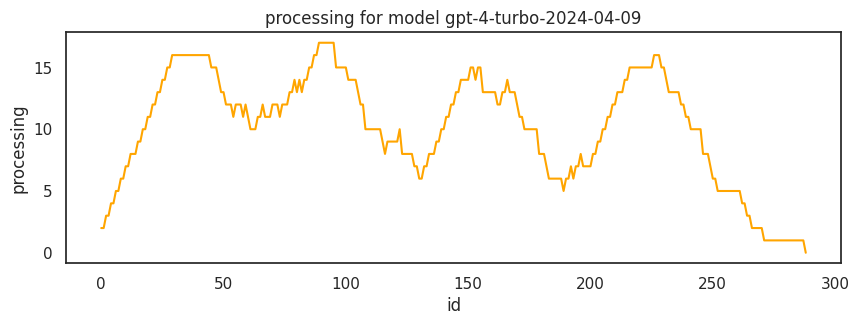

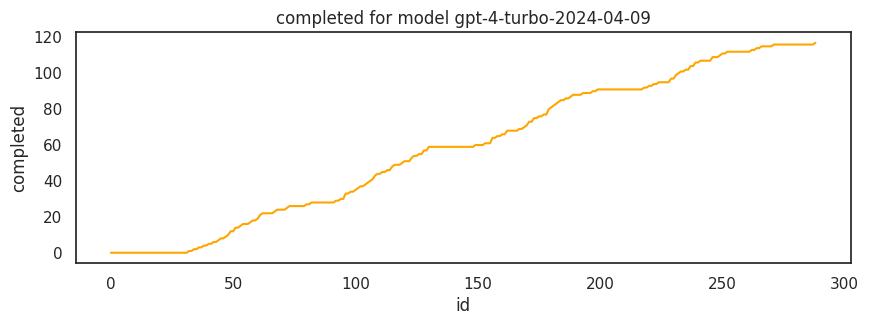

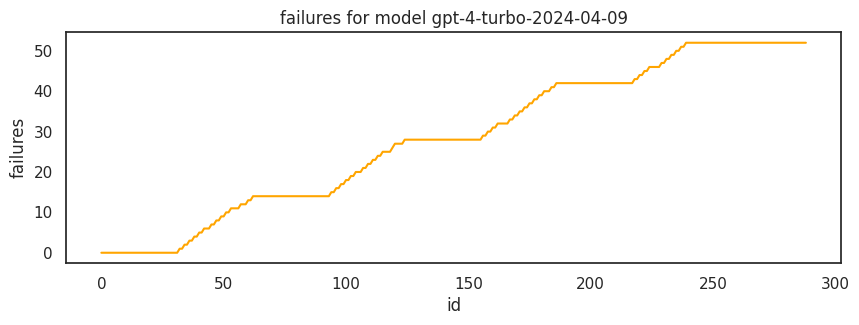

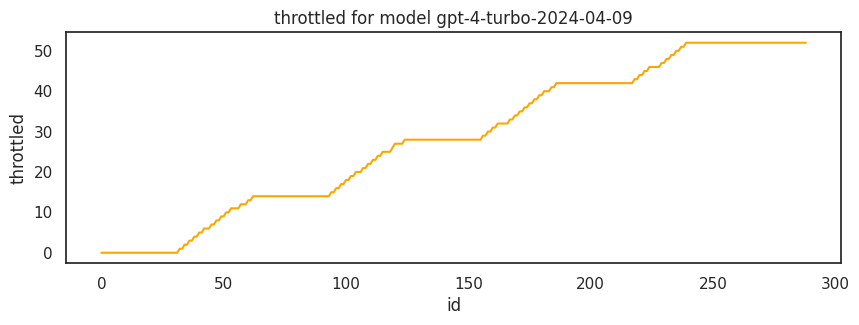

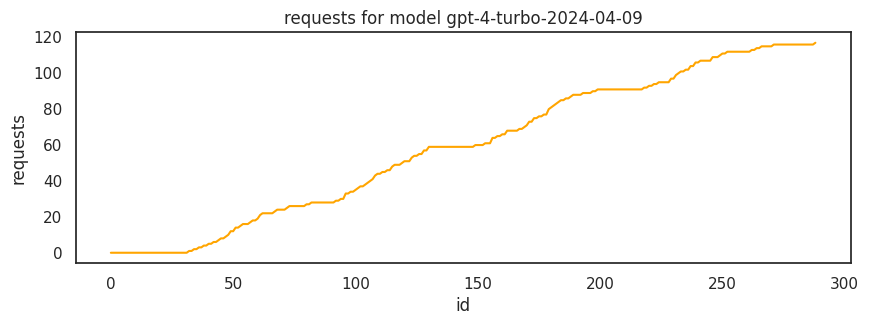

...

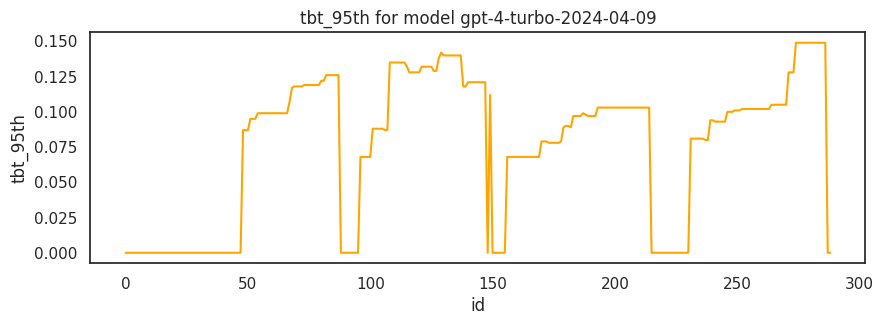

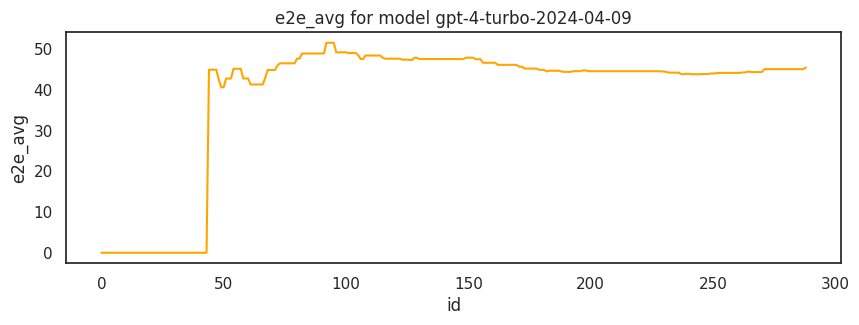

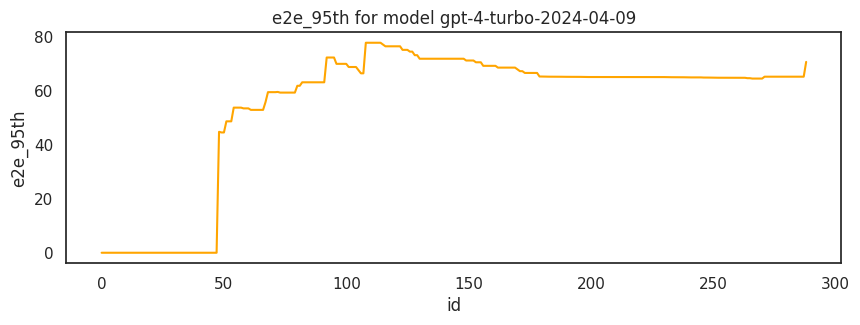

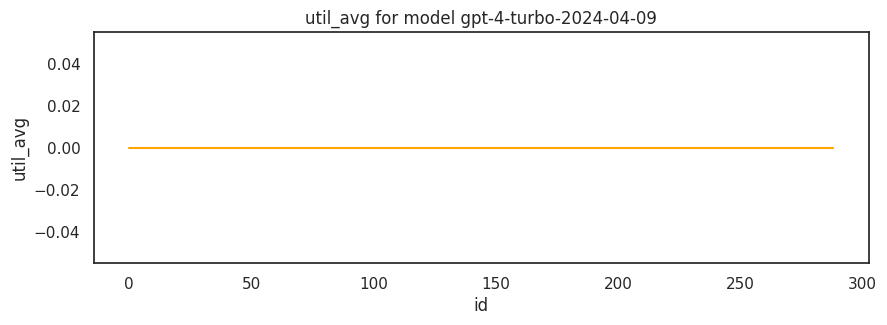

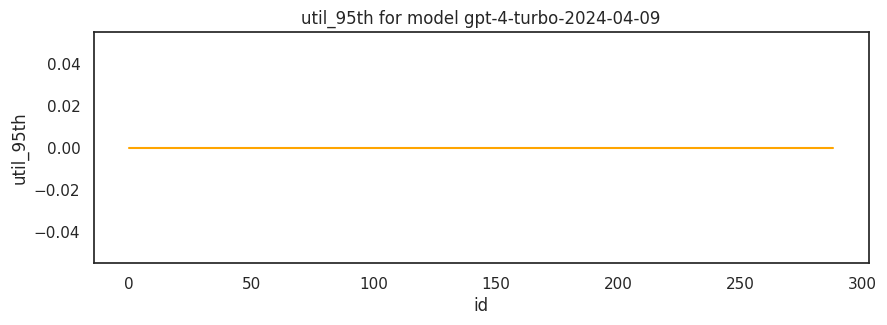

In [43]:
sns.set(style="white")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.lineplot(data=df2, x='index', y=col, color='orange')
    plt.title(f'{col} for model {MODEL2}')
    plt.xlabel('id')
    plt.ylabel(col)
    plt.show()

### 6.4 Boxplots using Plotly

In [44]:
for col in cols_to_plot:
    fig = px.box(df2,
                 y=df2[col],
                 title=f'{col} for model {MODEL2}',
                 template="ggplot2")
    fig.show()
    fig.write_image(os.path.join(HOME, RESULTS_DIR, f"{MODEL2}_boxplot_{col}.jpg"))

### 6.5 Boxplots using Seaborn

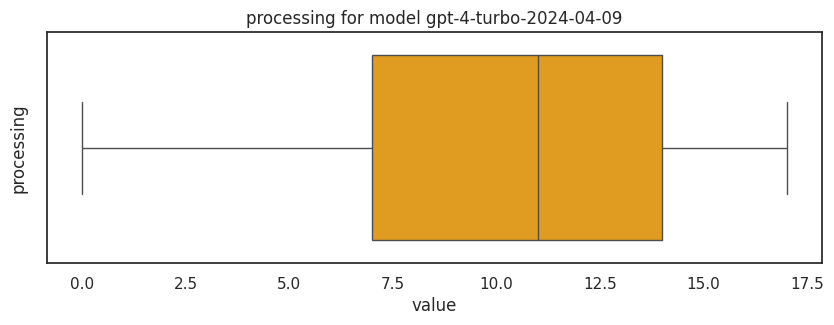

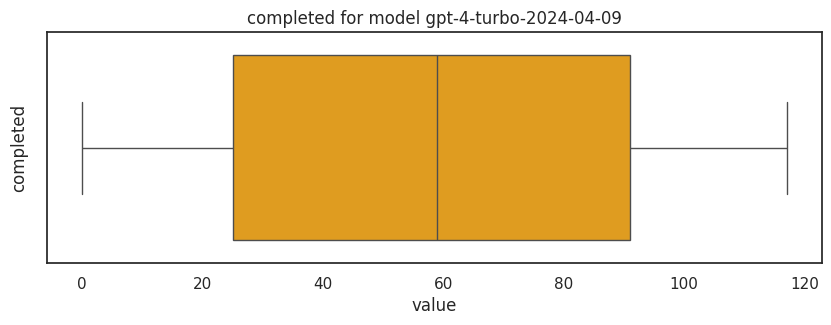

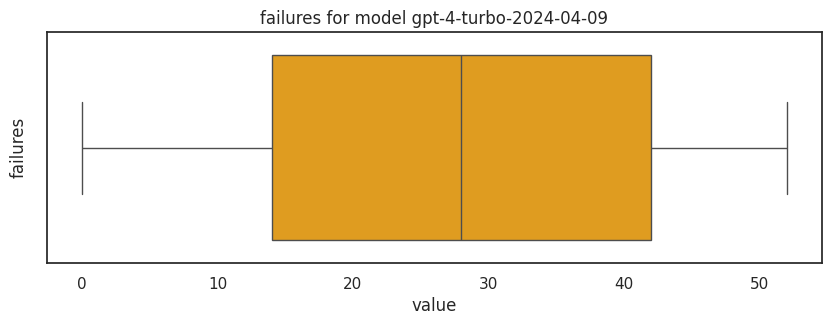

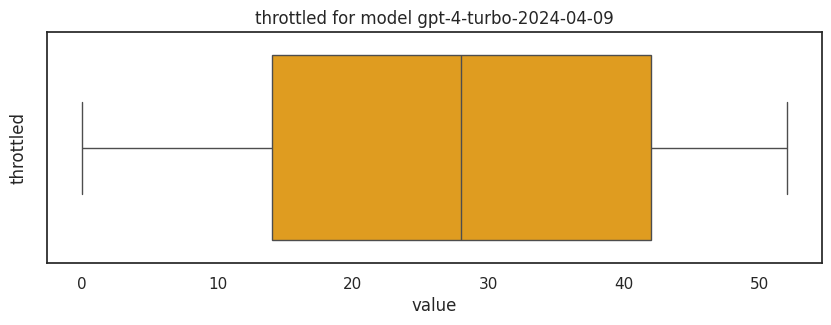

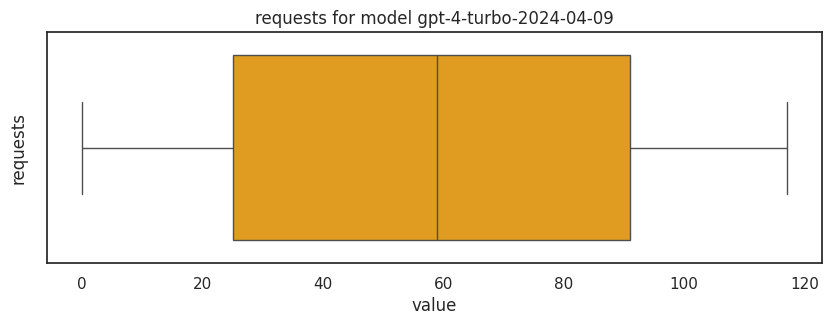

...

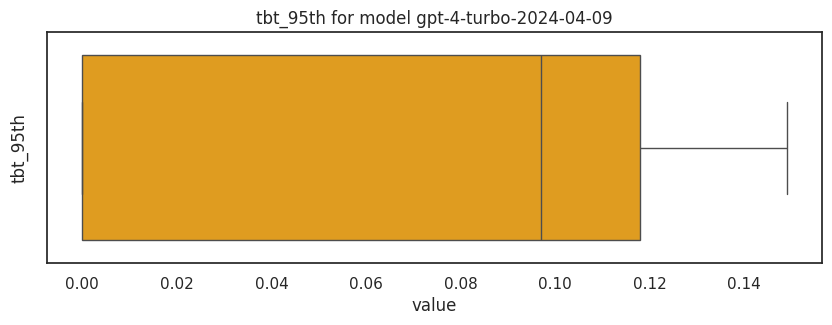

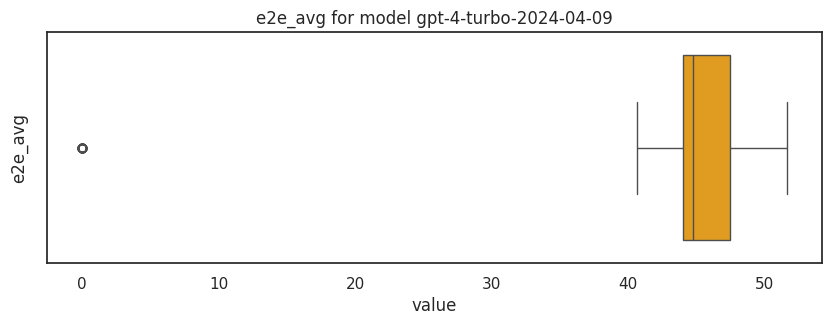

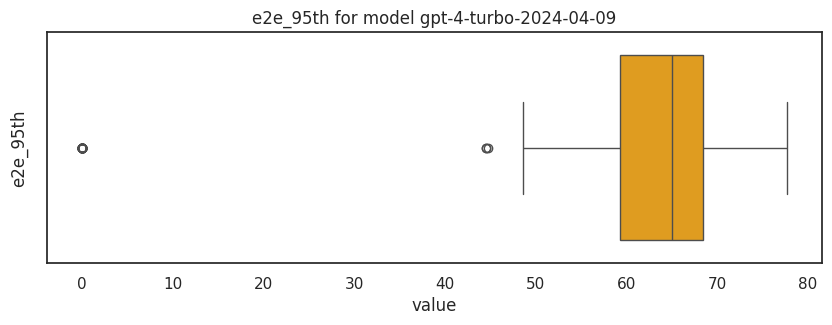

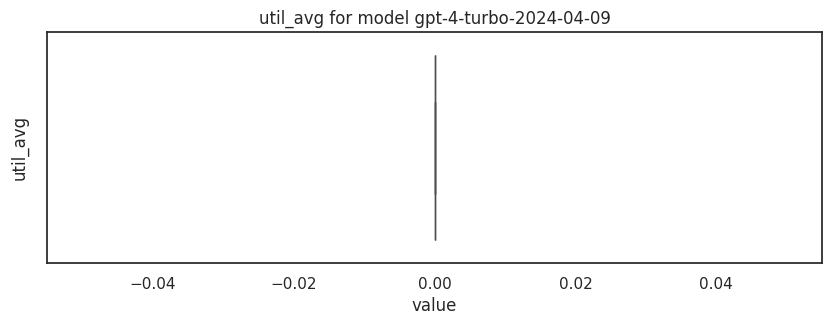

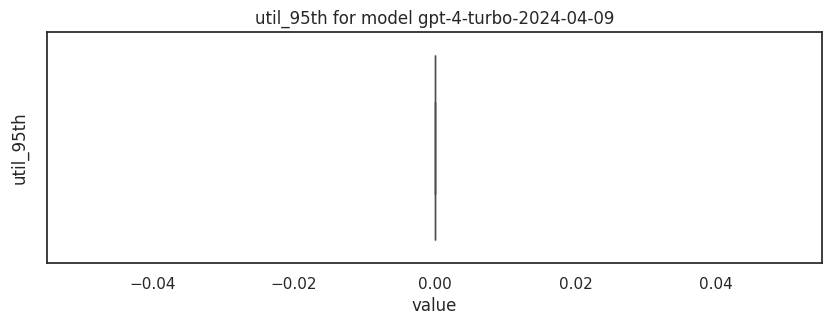

In [45]:
sns.set(style="white")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.boxplot(x=df2[col], color="orange")
    plt.title(f'{col} for model {MODEL2}')
    plt.xlabel('value')
    plt.ylabel(col)
    plt.show()

## 7. Benchmarks comparison results

In [46]:
df1.describe()

,index,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,246.000000,246.000000,246.000000,246.000000,246.0,246.0,246.000000,246.000000,246.000000,246.000000,246.000000,246.000000,246.000000,246.000000,246.0,246.0
mean,122.500000,25.379675,2.963415,57.752033,0.0,0.0,57.752033,38146.845528,0.172602,0.261907,0.011699,0.012878,6.112931,6.710252,0.0,0.0
std,71.158274,4.373864,0.634616,34.386748,0.0,0.0,34.386748,6574.152013,0.037289,0.064219,0.001862,0.002171,0.970242,1.071264,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,61.250000,26.000000,3.000000,27.000000,0.0,0.0,27.000000,39078.000000,0.158000,0.228000,0.012000,0.013000,6.224000,6.844000,0.0,0.0
50%,122.500000,26.000000,3.000000,57.500000,0.0,0.0,57.500000,39078.000000,0.171000,0.294000,0.012000,0.013000,6.268000,6.884000,0.0,0.0
75%,183.750000,27.000000,3.000000,87.000000,0.0,0.0,87.000000,40581.000000,0.188000,0.306000,0.012000,0.014000,6.300000,6.929000,0.0,0.0
max,245.000000,28.000000,5.000000,117.000000,0.0,0.0,117.000000,42084.000000,0.295000,0.331000,0.013000,0.014000,6.451000,7.234000,0.0,0.0


In [47]:
df2.describe()

,index,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.000000,289.0,289.0
mean,144.000000,5.254671,10.217993,58.851211,28.318339,28.318339,58.851211,7898.186851,1.058104,1.786491,0.065945,0.076484,38.801990,54.859201,0.0,0.0
std,83.571327,4.041991,4.395099,39.313404,17.745179,17.745179,39.313404,6074.431789,1.901375,2.799086,0.034957,0.051475,16.577219,25.139970,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,72.000000,1.000000,7.000000,25.000000,14.000000,14.000000,25.000000,1503.000000,0.525000,0.000000,0.064000,0.000000,44.055000,59.238000,0.0,0.0
50%,144.000000,6.000000,11.000000,59.000000,28.000000,28.000000,59.000000,9018.000000,0.690000,0.930000,0.079000,0.097000,44.734000,65.000000,0.0,0.0
75%,216.000000,9.000000,14.000000,91.000000,42.000000,42.000000,91.000000,13527.000000,0.987000,1.854000,0.087000,0.118000,47.451000,68.478000,0.0,0.0
max,288.000000,13.000000,17.000000,117.000000,52.000000,52.000000,117.000000,19539.000000,18.428000,13.140000,0.139000,0.149000,51.608000,77.674000,0.0,0.0


### Using Plotly

In [48]:
for col in cols_to_plot:
    combined_df = pd.concat([df1[[col, 'model']], df2[[col, 'model']]])
    fig = px.box(combined_df,
                 x="model",
                 y=col,
                 color='model',
                 title=f"{col}",
                 color_discrete_map={
                     "f'{MODEL1}'": "blue",
                     "f'{MODEL2}'": "green"
                 })
    fig.update_xaxes(title_text="Models",
                     ticktext=[f"{MODEL1}", f"{MODEL2}"])
    fig.update_layout(showlegend=False, template="seaborn")
    fig.show()
    fig.write_image(os.path.join(HOME, RESULTS_DIR, f"{MODEL1}_{MODEL2}_{col}.jpg"))

### Using Seaborn

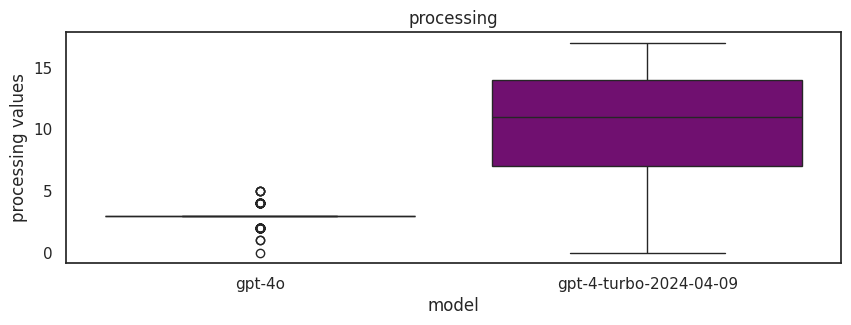

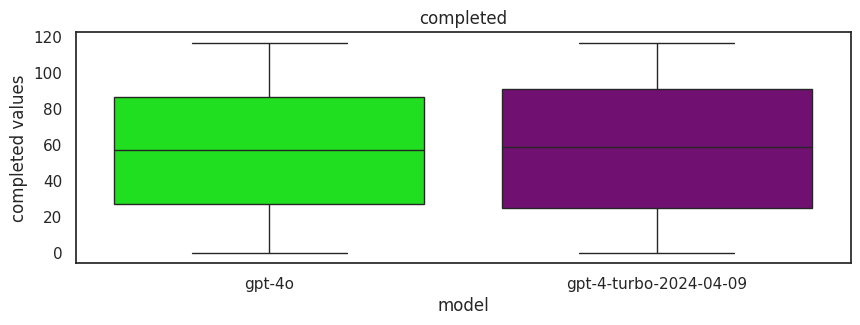

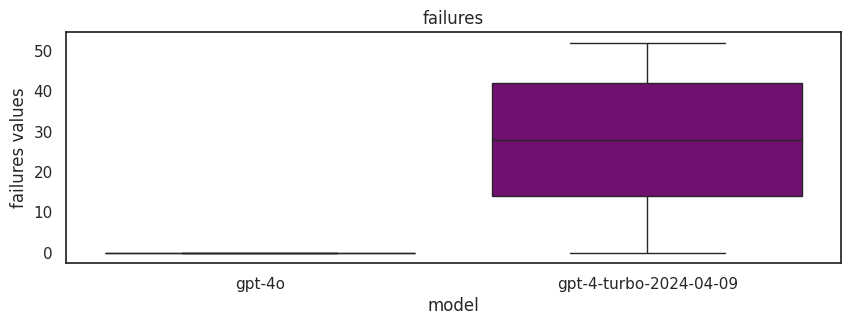

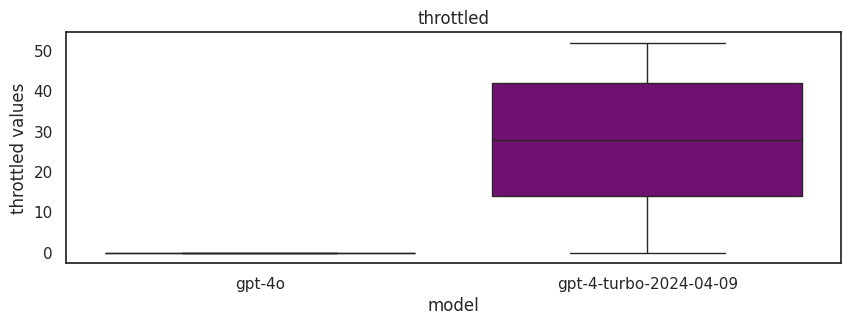

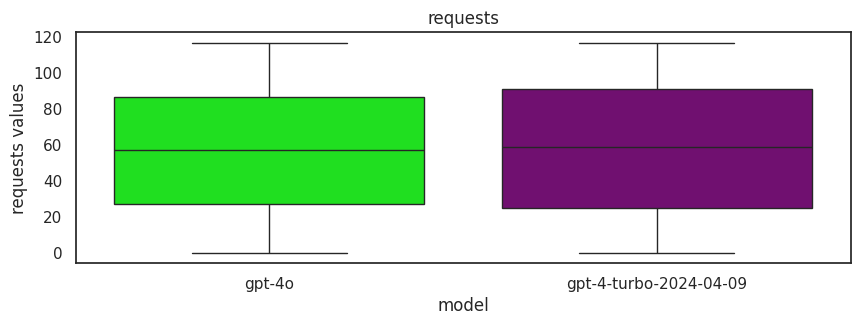

...

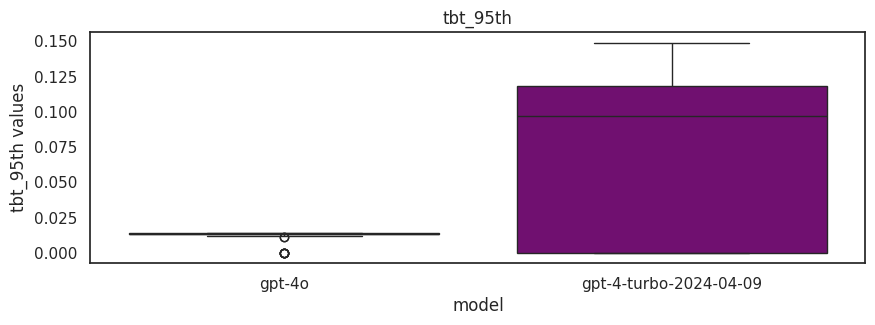

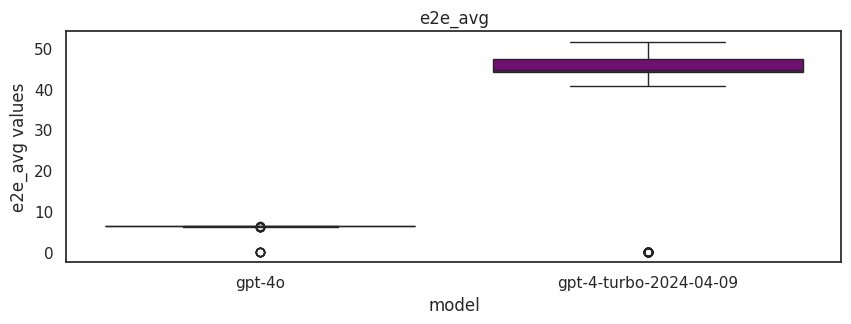

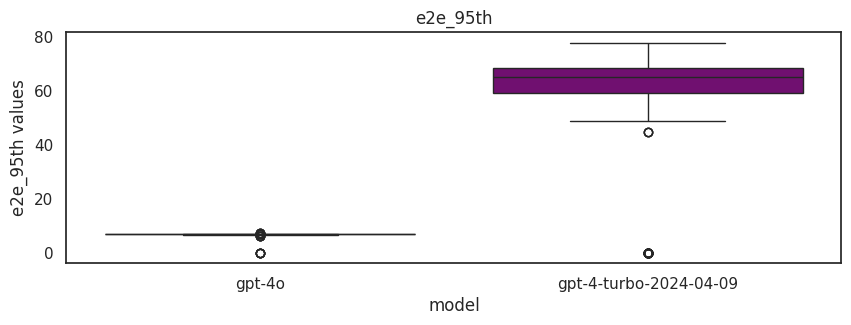

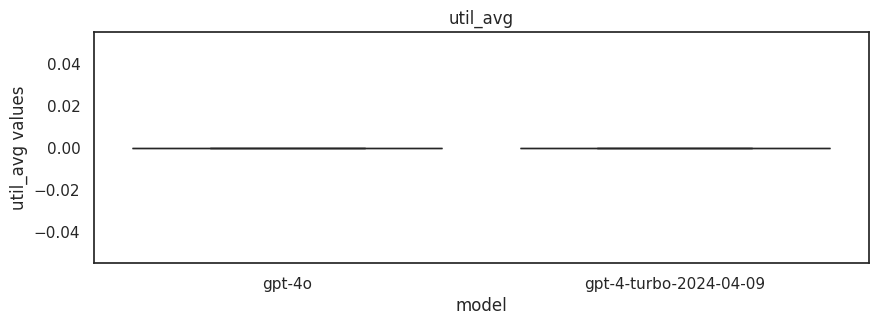

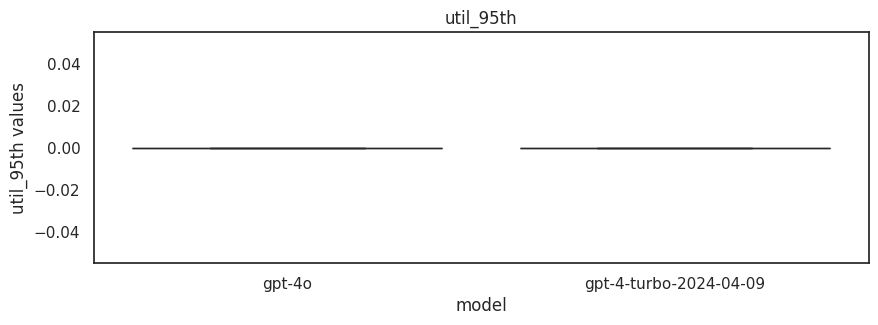

In [49]:
custom_palette = {f"{MODEL1}": 'lime', f"{MODEL2}": 'purple'}

for col in cols_to_plot:
    combined_df = pd.concat([df1[[col, 'model']], df2[[col, 'model']]])
    plt.figure(figsize=(10, 3))
    sns.boxplot(x='model',
                y=col,
                hue='model',
                data=combined_df,
                palette=custom_palette,
                dodge=False,
                legend=False)
    plt.title(f"{col}")
    plt.ylabel(f"{col} values")
    plt.show()

### Excel exports

In [50]:
df1.to_excel(os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}.xlsx"))

In [51]:
df2.to_excel(os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL2}.xlsx"))

In [52]:
all_df = pd.concat([df1, df2], ignore_index=True)

all_df.to_excel(
    os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}_and_{MODEL2}.xlsx"))

In [53]:
RESULTSDIR = HOME + '/' +  RESULTS_DIR
!ls $RESULTSDIR/*.xlsx -lh

-rwxrwxrwx 1 root root 26K Jun 20 09:40 /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_gpt-4-turbo-2024-04-09.xlsx
-rwxrwxrwx 1 root root 23K Jun 20 09:40 /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_gpt-4o.xlsx
-rwxrwxrwx 1 root root 45K Jun 20 09:40 /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_gpt-4o_and_gpt-4-turbo-2024-04-09.xlsx


## 8. EDA with sweetviz (optional)

### For Model 1

In [54]:
report1 = sv.analyze(df1)
report1.show_html(os.path.join(HOME, RESULTS_DIR,
                               f"benchmarks_sweetviz_{MODEL1}.html"),
                  open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4o.html was generated.



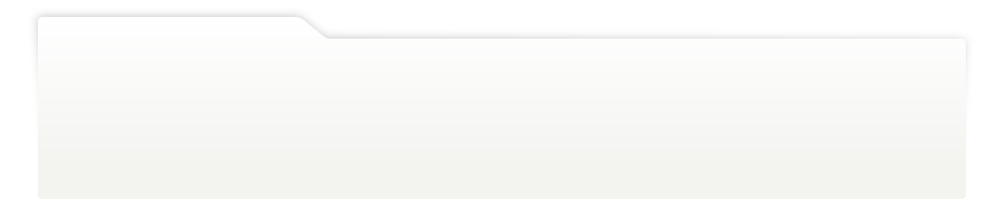
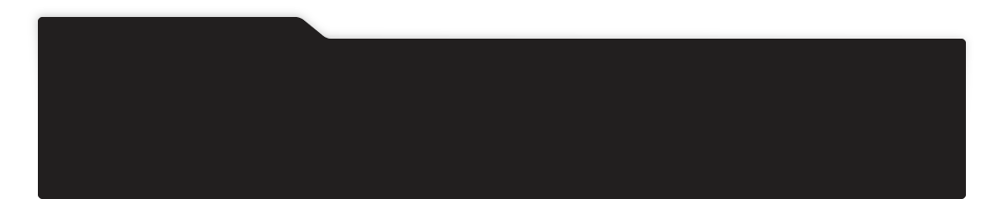
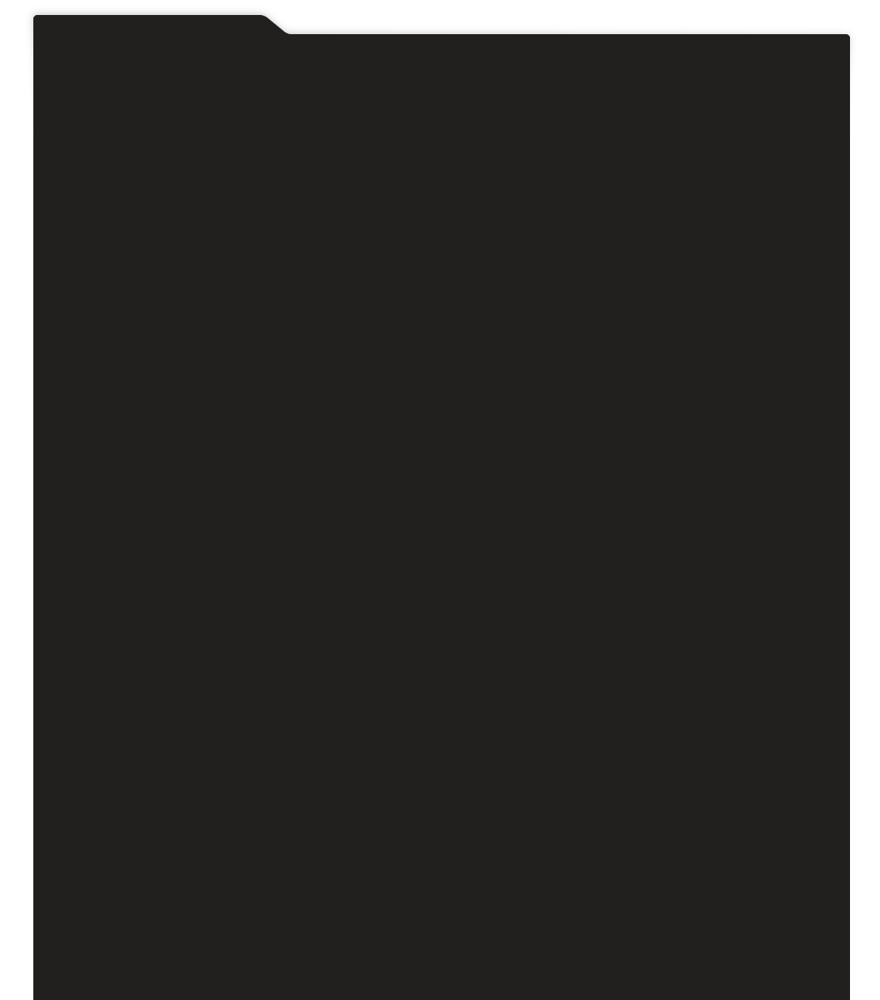
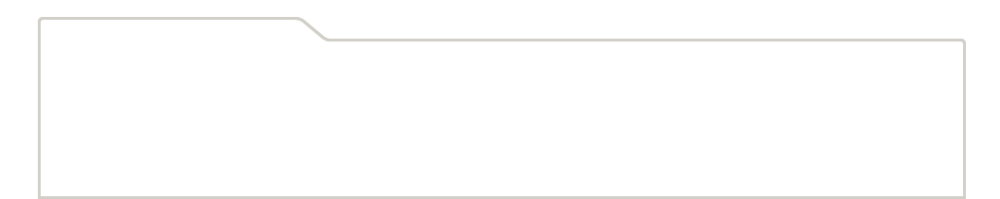
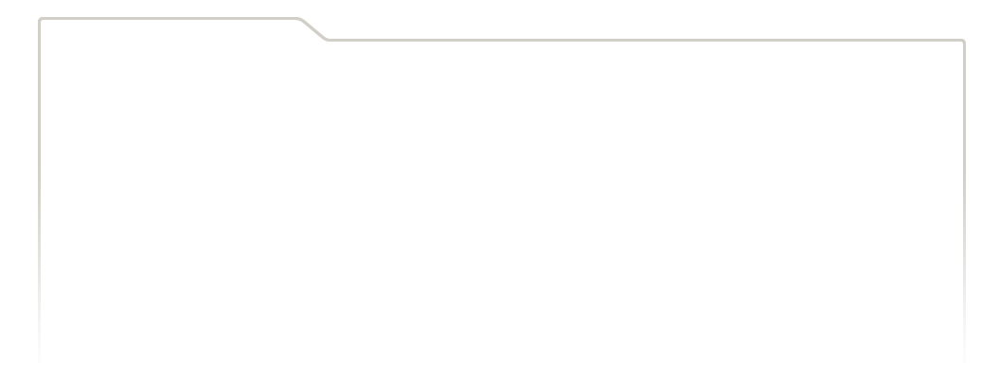
...
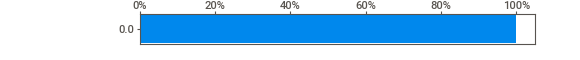
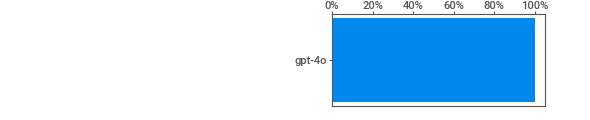
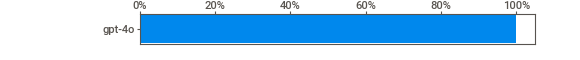
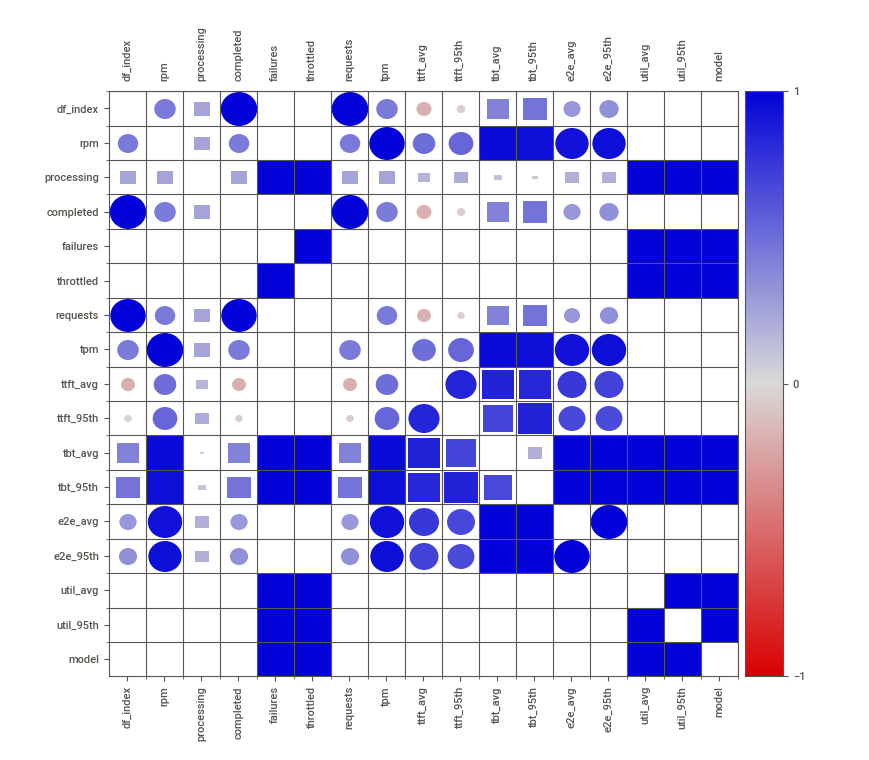
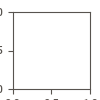

Report '/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4o.html' was saved to storage.


In [55]:
report1.show_notebook(
    layout='widescreen',
    filepath=os.path.join(HOME, RESULTS_DIR,
                          f"benchmarks_sweetviz_{MODEL1}.html"),
)

### For Model 2

In [56]:
report2 = sv.analyze(df2)
report2.show_html(os.path.join(HOME, RESULTS_DIR,
                               f"benchmarks_sweetviz_{MODEL2}.html"),
                  open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4-turbo-2024-04-09.html was generated.



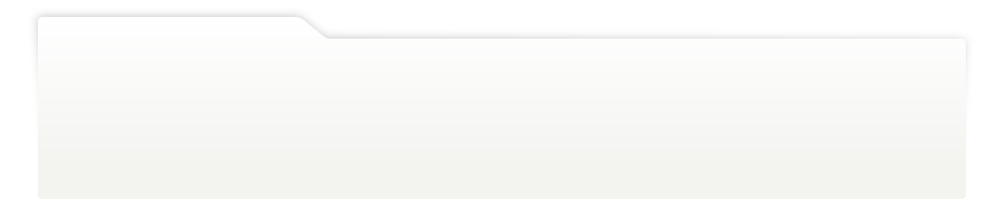
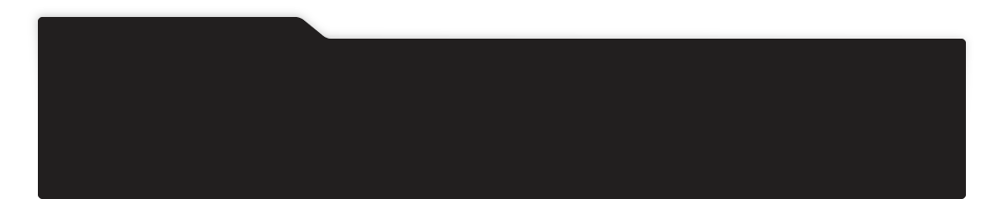
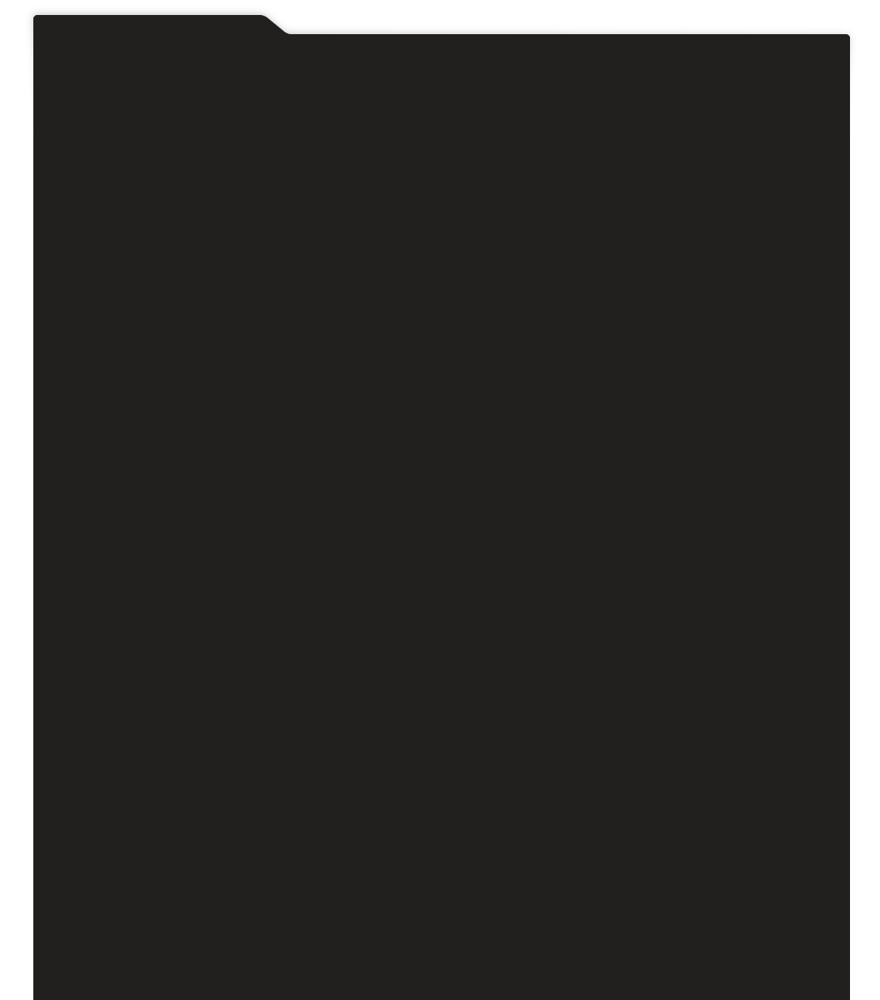
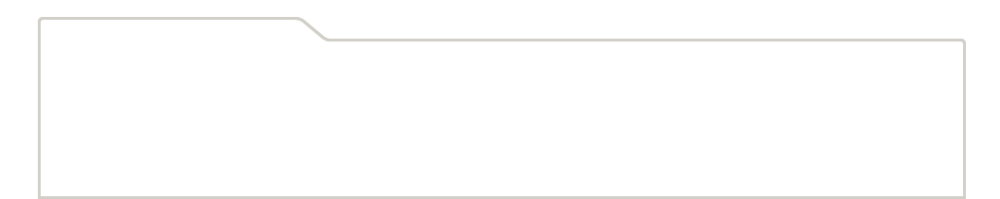
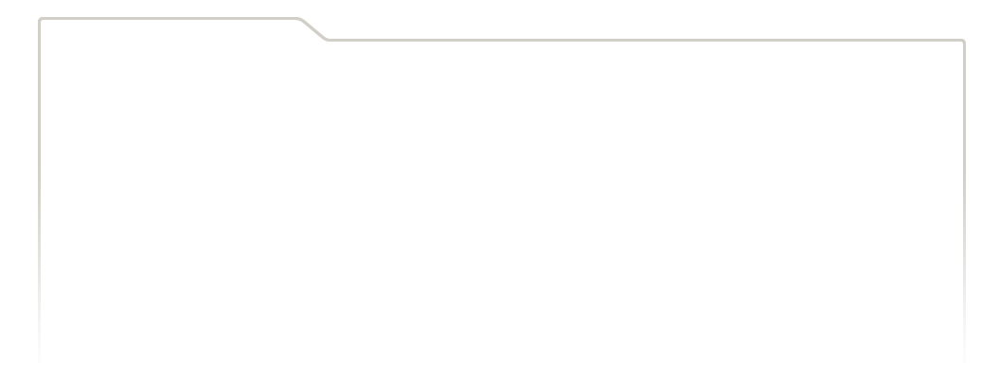
...
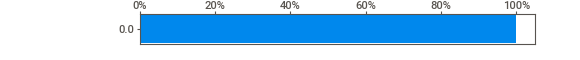
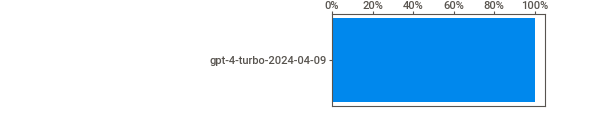
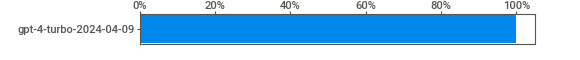
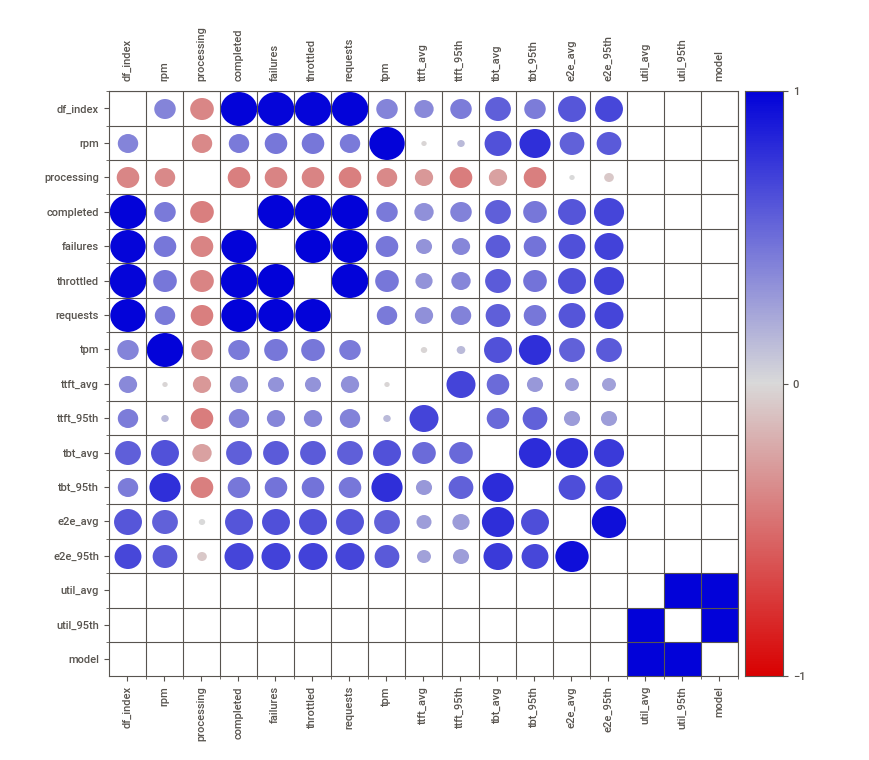
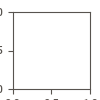

Report '/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4-turbo-2024-04-09.html' was saved to storage.


In [57]:
report2.show_notebook(
    layout='widescreen',
    filepath=os.path.join(HOME, RESULTS_DIR,
                          f"benchmarks_sweetviz_{MODEL2}.html"),
)

### For all models

In [58]:
report_all = sv.analyze(all_df)
report_all.show_html(os.path.join(
    HOME, RESULTS_DIR, f"benchmarks_sweetviz_{MODEL1}_{MODEL2}.html"),
    open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4o_gpt-4-turbo-2024-04-09.html was generated.



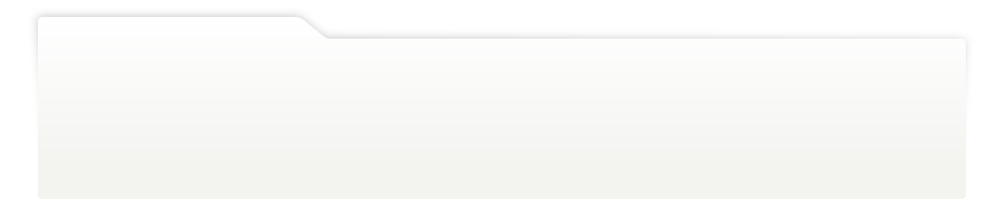
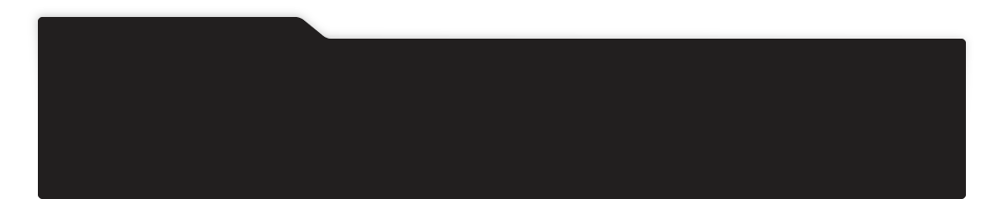
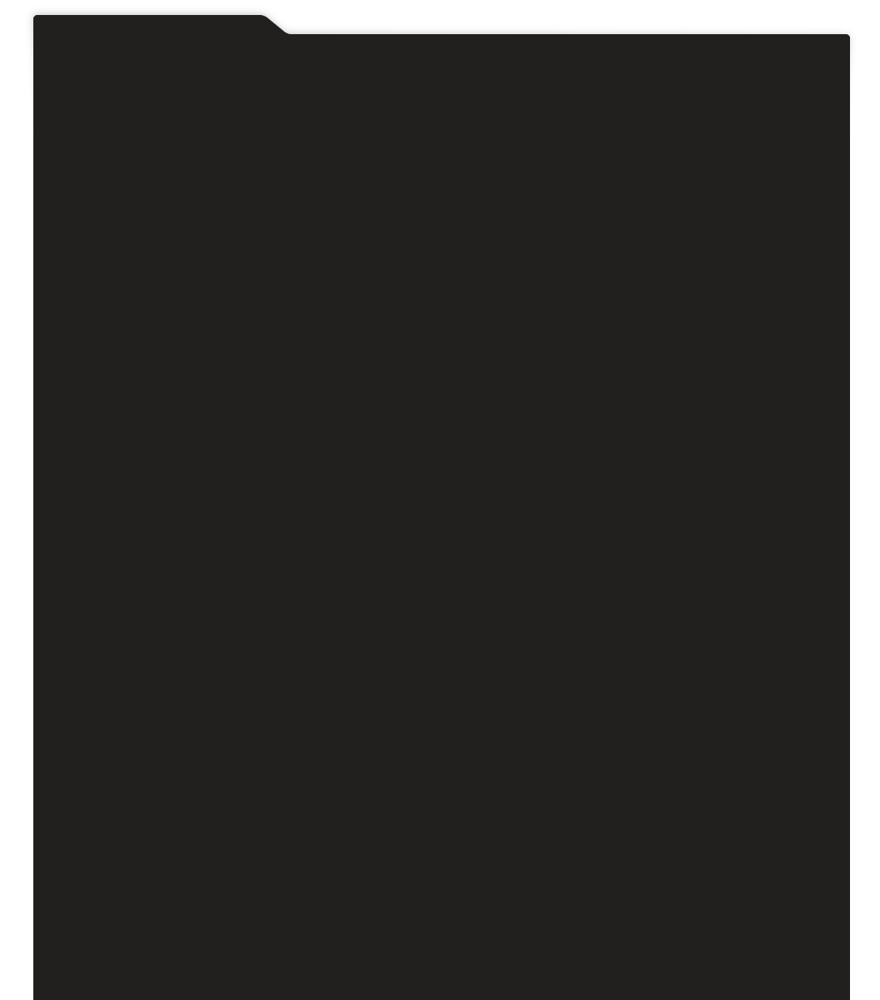
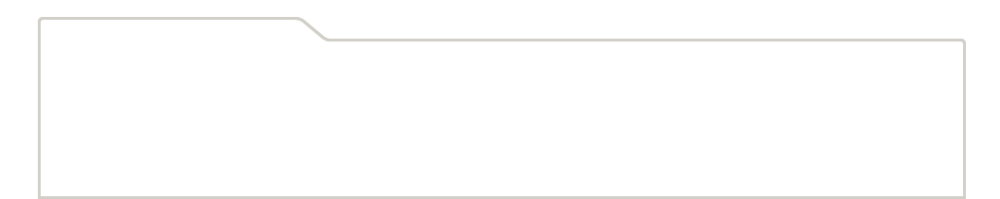
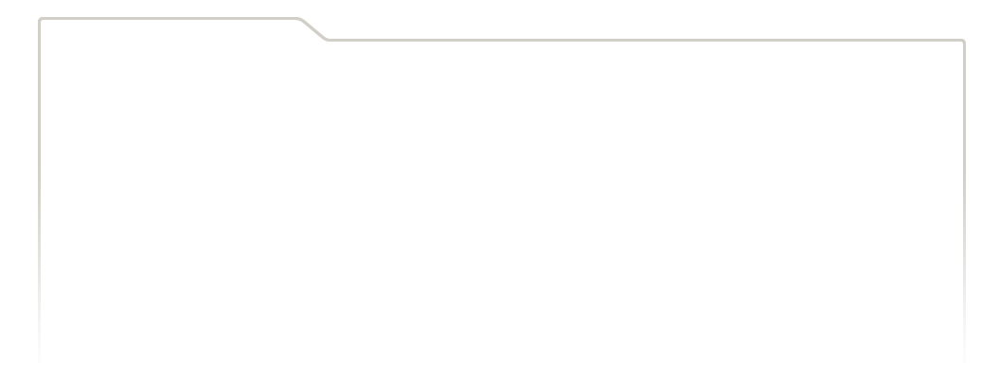
...
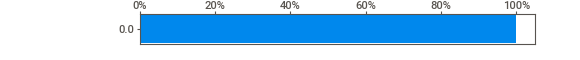
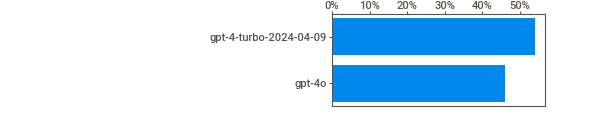
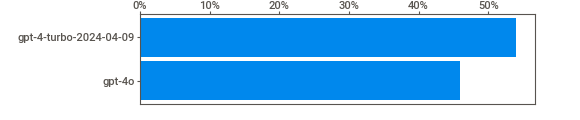
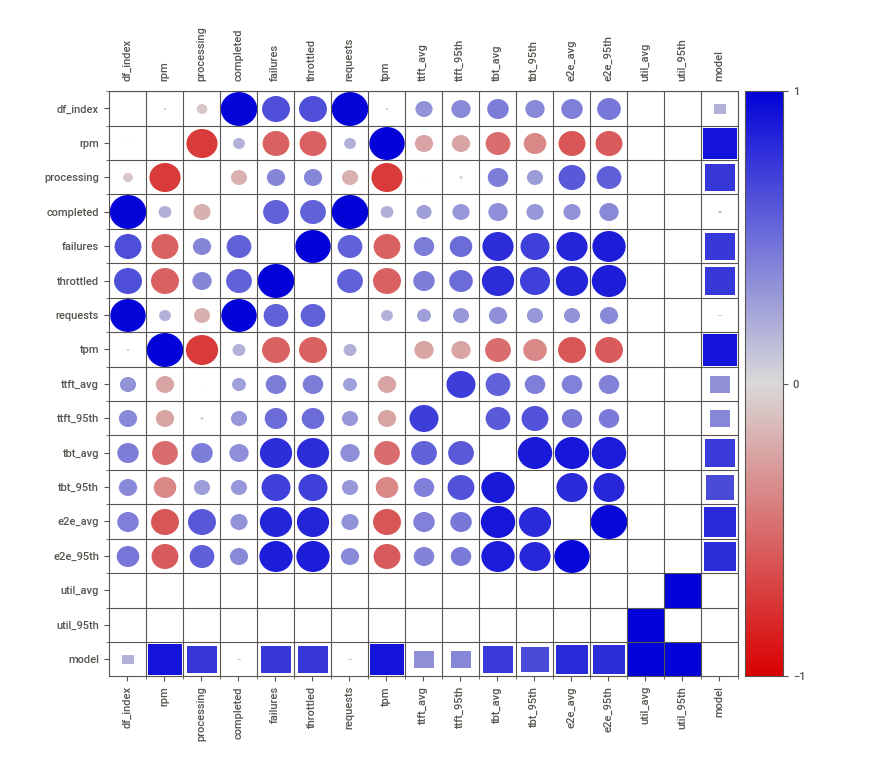
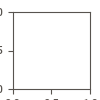

Report '/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4o_gpt-4-turbo-2024-04-09.html' was saved to storage.


In [59]:
report_all.show_notebook(
    layout='widescreen',
    filepath=os.path.join(HOME, RESULTS_DIR,
                          f"benchmarks_sweetviz_{MODEL1}_{MODEL2}.html"),
)

## 09. Use Azure OpenAI to analyse the benchmarks results

In [60]:
benchmarks_results = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}_and_{MODEL2}.xlsx")
df = pd.read_excel(benchmarks_results)

In [61]:
# Prompt
SYSTEM_MSG = "Analyze the following data. This dataset is a benchmarks about two GenAI models.\
You should provide insights for each model and generate a comparative analysis. Give some details:\n\n"

PROMPT = df.to_string(index=False)

# Setting up the AOAI client
client = AzureOpenAI(
        api_key=KEY,
        api_version=VERSION,
        base_url=f"{ENDPOINT}/openai/deployments/{MODEL1}",
)

# Sending the request
response = client.chat.completions.create(
    model=f"{MODEL1}",
    messages=[
        {"role": "system", "content": SYSTEM_MSG},
        {"role": "user", "content": PROMPT},
    ],
    temperature=0.,
)

In [62]:
# Print the results
print("\033[1;31;34m")
print(response.choices[0].message.content)


### Insights for Each Model

#### GPT-4o
1. **Performance Metrics**:
   - **Requests per Minute (RPM)**: The RPM starts at 0 and gradually increases, peaking at 27 RPM.
   - **Throughput (TPM)**: The throughput per minute (TPM) increases consistently, reaching a maximum of 40581.
   - **Time to First Token (TTFT)**: The average TTFT decreases over time, starting from 0.295 seconds and reaching as low as 0.152 seconds.
   - **End-to-End Latency (E2E)**: The average end-to-end latency starts at 6.035 seconds and decreases to around 6.202 seconds.
   - **Failures**: There are no recorded failures throughout the dataset.
   - **Utilization**: The utilization metrics are consistently at 0, indicating no throttling or resource constraints.

2. **Trends**:
   - **Efficiency**: The model becomes more efficient over time, as indicated by the decreasing TTFT and E2E latency.
   - **Scalability**: The model handles increasing loads well, as seen by the increasing RPM and TPM without any failures

In [63]:
report = response.choices[0].message.content

In [64]:
report_file = os.path.join(HOME, RESULTS_DIR, f"report_{MODEL1}_{MODEL2}.txt")

with open(report_file, "w") as file:
    file.write(report)

print(f"Report saved to {report_file}")

Report saved to /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/report_gpt-4o_gpt-4-turbo-2024-04-09.txt


## 10. Saved results

In [65]:
os.chdir(HOME)

In [66]:
excel_link = FileLink(path=os.path.join(RESULTS_DIR, f"benchmarks_{MODEL1}_and_{MODEL2}.xlsx"))
excel_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_20Jun2024_092537/benchmarks_gpt-4o_and_gpt-4-turbo-2024-04-09.xlsx

In [67]:
!ls $RESULTS_DIR/*.* -lt

-rwxrwxrwx 1 root root    3665 Jun 20 09:41 results/results_20Jun2024_092537/report_gpt-4o_gpt-4-turbo-2024-04-09.txt
-rwxrwxrwx 1 root root 1699917 Jun 20 09:40 results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4o_gpt-4-turbo-2024-04-09.html
-rwxrwxrwx 1 root root 1728265 Jun 20 09:40 results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4-turbo-2024-04-09.html
-rwxrwxrwx 1 root root 1398950 Jun 20 09:40 results/results_20Jun2024_092537/benchmarks_sweetviz_gpt-4o.html
-rwxrwxrwx 1 root root   45136 Jun 20 09:40 results/results_20Jun2024_092537/benchmarks_gpt-4o_and_gpt-4-turbo-2024-04-09.xlsx
-rwxrwxrwx 1 root root   26248 Jun 20 09:40 results/results_20Jun2024_092537/benchmarks_gpt-4-turbo-2024-04-09.xlsx
-rwxrwxrwx 1 root root   23409 Jun 20 09:40 results/results_20Jun2024_092537/benchmarks_gpt-4o.xlsx
-rwxrwxrwx 1 root root   12558 Jun 20 09:40 results/results_20Jun2024_092537/gpt-4o_gpt-4-turbo-2024-04-09_util_95th.jpg
-rwxrwxrwx 1 root root   11861 Jun 20 09:40 results/

In [76]:
output_filename = 'zip_' + '/'.join(RESULTS_DIR.split('/')[1:])
shutil.make_archive(output_filename, 'zip', RESULTS_DIR)
print(f"Directory {RESULTS_DIR} has been zipped to {output_filename}.zip")

Directory results/results_20Jun2024_092537 has been zipped to zip_results_20Jun2024_092537.zip


In [77]:
zipfile_link = FileLink(f"{output_filename}.zip")
zipfile_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/zip_results_20Jun2024_092537.zip

## 11. Post Processing (optional)

In [78]:
# Delete the dir results
#shutil.rmtree(RESULTS_DIR)